In [250]:
from torchvision import models
import numpy as np
import cv2
import PIL
import torch
import torchvision.transforms as transforms

from pytorch_grad_cam import GradCAM,GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image,preprocess_image


In [251]:
def check_img(img):
        print(img.dtype)

        if np.min(img) < 0 or np.max(img) > 1:
                print("Values are not in the range [0, 1]")
                min_value = np.min(img)
                max_value = np.max(img)

                print("Minimum pixel value:", min_value)
                print("Maximum pixel value:", max_value)

        else:
                print("Image is valid") 

In [252]:

def predicted_class_acc(img, model):
    preprocess = transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize((224, 224)),  # Resize to match ResNet's input size
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    input_tensor = preprocess(img).unsqueeze(0)  # Add batch dimension

    # Feed the input tensor through the model
    with torch.no_grad():
        logits = model(input_tensor)

    # Apply softmax to get class probabilities
    probs = torch.softmax(logits, dim=1)

    # Get the predicted class label
    pred_class = torch.argmax(probs, dim=1).item()
    print("Predicted class:", pred_class)
    
    return pred_class

Normal ResNet50

In [253]:
def normal_model(model, target_layers, dog_class, img):
    
    # instantiate the model
    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class

    input_tensor = preprocess_image(img)

    # generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)
  
    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)

Schizophrenia

In [254]:
def schizo_model(model, target_layers, dog_class, img):

    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class
    input_tensor = preprocess_image(img)

    # generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_image = show_cam_on_image(img, grayscale_cams[0, :], use_rgb=True)

    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)

Gaussian Blur 

In [255]:
def gauss_blur(model, target_layers, dog_class, img):

    # Define the location and size of the region to apply the blur
    x, y, w, h = (100, 100, 50, 50)  # Example: x and y are the coordinates of the top-left corner, w and h are the width and height

    # Apply Gaussian blur to the entire image
    blurred_img = cv2.GaussianBlur(img, (35, 35), 0)  # Adjust the kernel size for desired blur intensity

    input_tensor = preprocess_image(blurred_img)

    # generate CAM
    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)
    cam_on_blurred = show_cam_on_image(blurred_img, grayscale_cams[0, :], use_rgb=True)


    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), cam_on_blurred))
    PIL.Image.fromarray(images)

    return cam_on_blurred, predicted_class_acc(cam_on_blurred, model)    

Color Augmentation

In [256]:
def aug_color(model, target_layers, dog_class, img):

    cam = GradCAM(model=model, target_layers=target_layers) # use GradCamPlusPlus class

    # # Split the image into its RGB channels
    b, g, r = cv2.split(img)

    # Decrease intensity of the red channel
    r = cv2.add(r, 0.4)  # Add 1 to the red channel values

    # Clip pixel values to ensure they stay within the range [0, 255]
    r = np.clip(r, 0, 1)

    # Merge the channels back together
    img_color = cv2.merge((b, g, r))

    input_tensor = preprocess_image(img_color)

    # generate CAM
    grayscale_cams = cam(input_tensor=input_tensor, targets=dog_class)

    cam_image = show_cam_on_image(img_color, grayscale_cams[0, :], use_rgb=True)
    cam = np.uint8(255*grayscale_cams[0, :])

    cam = cv2.merge([cam, cam, cam])

    # display the original image & the associated CAM
    images = np.hstack((np.uint8(255*img), np.uint8(255*img_color), cam_image))
    PIL.Image.fromarray(images)

    return cam_image, predicted_class_acc(cam_image, model)    ### this doesnt use coulour for cam

In [258]:
def create_models():

    ## Normal Mmdel:
    # use the pretrained ResNet50 model

    model = models.resnet50(pretrained=True)
    model.eval()


    ## Schizophrenia model:

    model_s = models.resnet50(pretrained=True)
    model_s.eval()
    model_s.fc = torch.nn.Linear(2048, 255)

    target_layers = [model.layer4]
    target_layers_s = [model_s.layer4]

    return model, model_s, target_layers, target_layers_s


In [259]:
names = ['Lab', 'ST', 'Pug', 'GS']
ranges = [(0, 3), (3, 6), (6, 9), (9, 12)]
numbers = [208, 155, 254, 235]  

name_to_range = {}

# dictionary (dog_name, dog_range, dog_ID)
for name, range_tuple, number in zip(names, ranges, numbers):
    name_to_range[name] = (list(range(*range_tuple)), number)

    
predict_arr_n = []
predict_arr_b = []
predict_arr_g = []
predict_arr_c = []

In [260]:
def dog_run(dog_type):

    testing_model_s_effect = False

    global name_to_range
    global predict_arr_n
    global predict_arr_b
    global predict_arr_g
    global predict_arr_c

    model, model_s, target_layers, target_layers_s = create_models()

    lab_info = name_to_range.get(dog_type)
    range_list, number = lab_info

    num_label = 1

    for i in range_list: 

        dog_class = [ClassifierOutputTarget(number)]
        print(f"Processing {dog_type} {i+1}: Class {number}")

        img = np.array(PIL.Image.open(f'/Users/liviamurray/552_ALproj/dogs/{dog_type}/{num_label}.jpeg'))

        # img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        img = cv2.resize(img, (300, 300))
        img = np.float32(img) / 255

        normal_image, output_label_n = normal_model(model, target_layers, dog_class, img)

        if not testing_model_s_effect:
    
            bio_plausability_image, output_label_b = schizo_model(model_s, target_layers_s, dog_class, img)
            
            gaussian_blur, output_label_g = gauss_blur(model_s, target_layers_s, dog_class, img)
        
            augmented_colour, output_label_c = aug_color(model_s, target_layers_s, dog_class, img)

        else:
            bio_plausability_image, output_label_b = schizo_model(model_s, target_layers_s, dog_class, img)
            
            gaussian_blur, output_label_g = gauss_blur(model, target_layers, dog_class, img)
        
            augmented_colour, output_label_c = aug_color(model, target_layers, dog_class, img)
    
        # Concatenate the original image with each output image horizontally
        concatenated_img = np.concatenate((np.uint8(255*img), normal_image, bio_plausability_image, gaussian_blur, augmented_colour), axis=1)

        # Add labels to the concatenated image
        label_font = cv2.FONT_HERSHEY_COMPLEX
        label_scale = 0.6
        label_color = (255, 255, 255)
        label_thickness = 1
        cv2.putText(concatenated_img, 'Original', (10, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Normal', (310, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Dysfunctional Connectivity', (610, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Blur', (910, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)
        cv2.putText(concatenated_img, 'Augmented Color', (1210, 30), label_font, label_scale, label_color, label_thickness, cv2.LINE_AA)

        # cv2.imwrite(f'/Users/adeleyounis/Desktop/3A/syde552/Final Project/552_ALproj/output.jpg', concatenated_img)
        concatenated_img_bgr = cv2.cvtColor(concatenated_img, cv2.COLOR_RGB2BGR)
        cv2.imwrite(f'/Users/liviamurray/552_ALproj/output_images/{dog_type}_{num_label}_run5.jpg', concatenated_img_bgr)

        concatenated_img_pil = PIL.Image.fromarray(concatenated_img)

        # Display the concatenated image
        display(concatenated_img_pil)


        predict_arr_n.append([output_label_n, number, f'{dog_type} {num_label}'])
        predict_arr_b.append([output_label_b, number, f'{dog_type} {num_label}'])
        predict_arr_g.append([output_label_g, number, f'{dog_type} {num_label}'])
        predict_arr_c.append([output_label_c, number, f'{dog_type} {num_label}'])

        num_label += 1



Processing Lab 1: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 67
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 15
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

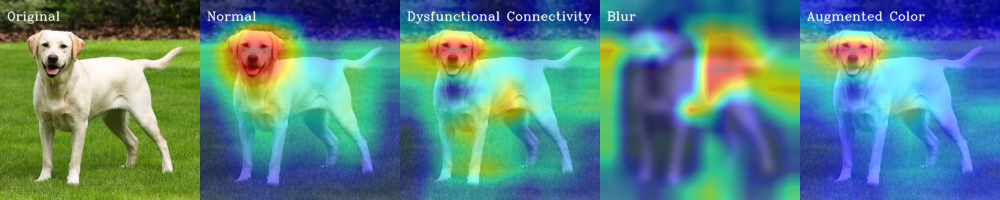

Processing Lab 2: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 67
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 197
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

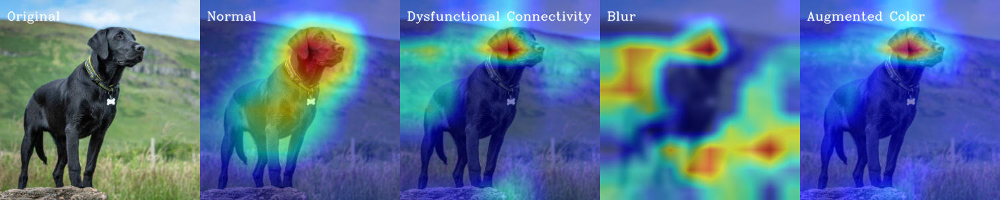

Processing Lab 3: Class 208
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 749
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 211
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 88
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Lib

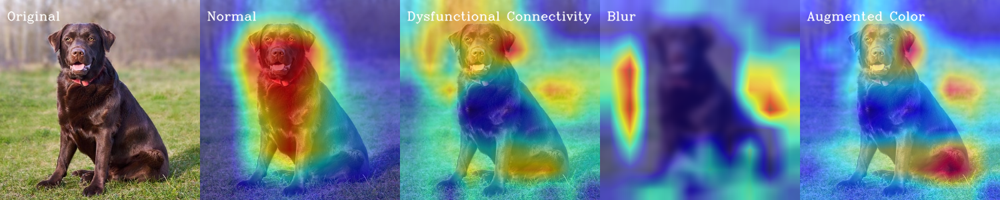

In [261]:
dog_run('Lab')

Processing ST 4: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 283
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 22
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 216
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

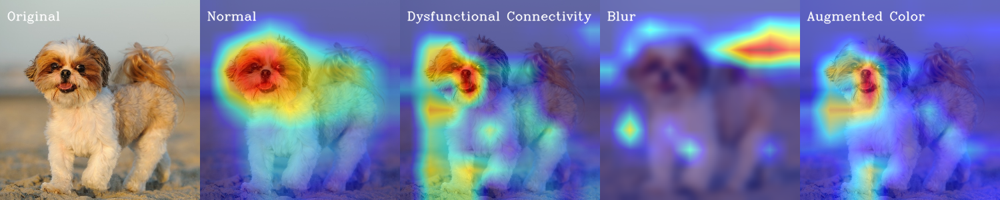

Processing ST 5: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 154
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 16
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 216
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

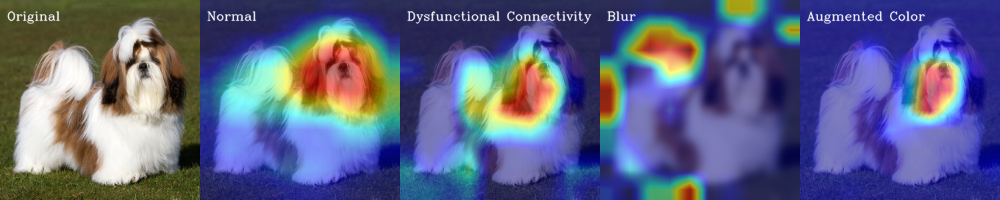

Processing ST 6: Class 155
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 154
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 152
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 75
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

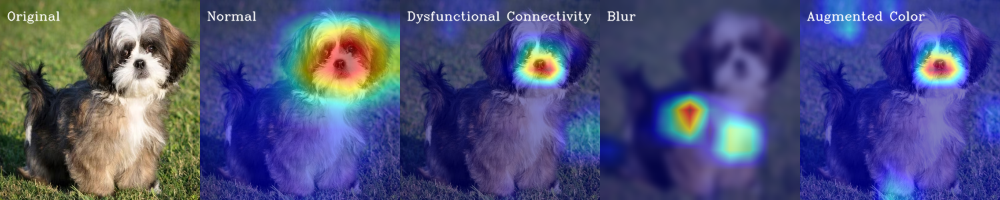

In [262]:
dog_run('ST')

Processing Pug 7: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 862
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 62
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 1
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libra

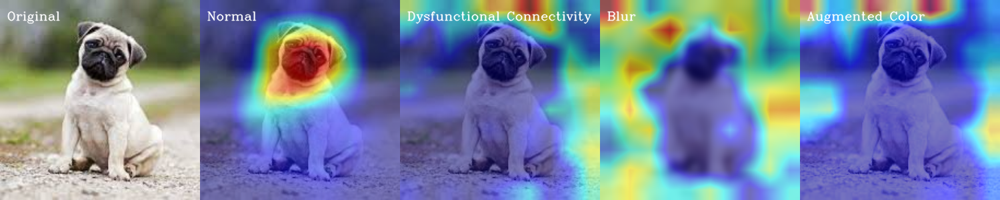

Processing Pug 8: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 62
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 90
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

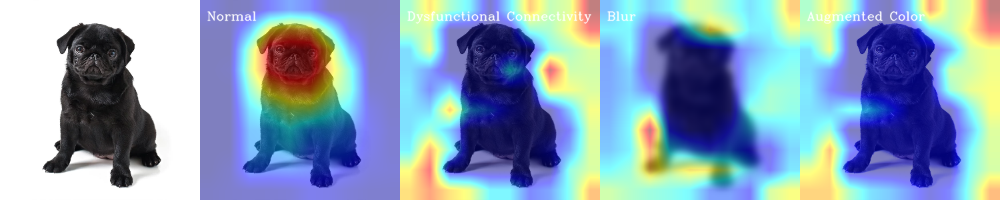

Processing Pug 9: Class 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 254
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 62
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 87
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

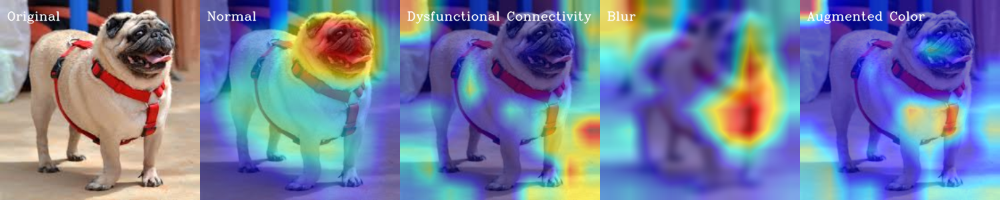

In [263]:
dog_run('Pug')

Processing GS 10: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 20
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 79
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Libr

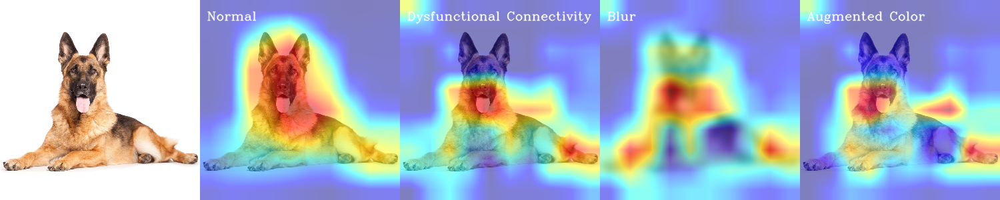

Processing GS 11: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 185
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 185
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Li

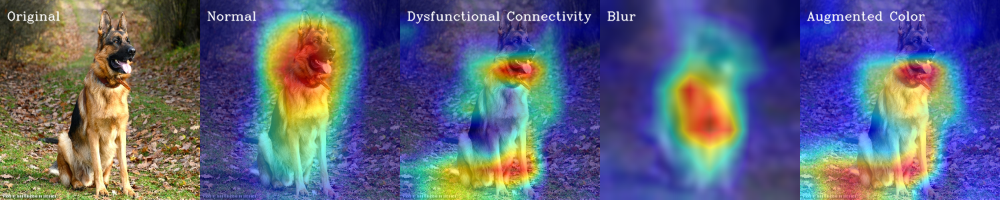

Processing GS 12: Class 235
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 107
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 173
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Predicted class: 185
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Li

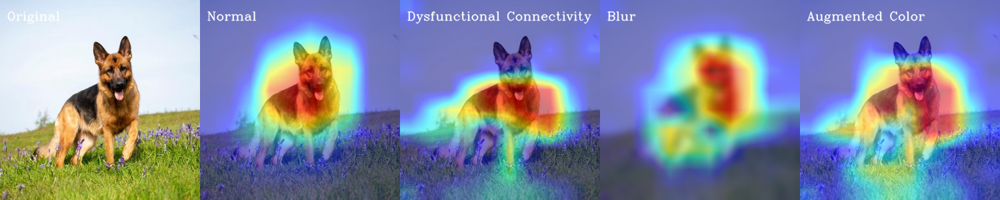

In [264]:
dog_run('GS')

## Performance Eval

In [265]:
from sklearn.metrics import precision_score, recall_score, f1_score
import matplotlib.pyplot as plt


In [266]:
nn = ['n', 'b', 'g', 'c']
corr_dict = {}

for letter in nn:
    corr = 0
    for arr in globals()['predict_arr_' + letter]:  # Access the arrays using globals()
        if arr[0] == arr[1]:
            corr += 1
    corr_dict[letter] = corr  # Store the count of correct predictions for each array

# Print the results
for letter, corr in corr_dict.items():
    print(f"Correctly predicted number for '{letter}': {corr} / {len(predict_arr_n)}")

    

Correctly predicted number for 'n': 4 / 12
Correctly predicted number for 'b': 0 / 12
Correctly predicted number for 'g': 0 / 12
Correctly predicted number for 'c': 0 / 12


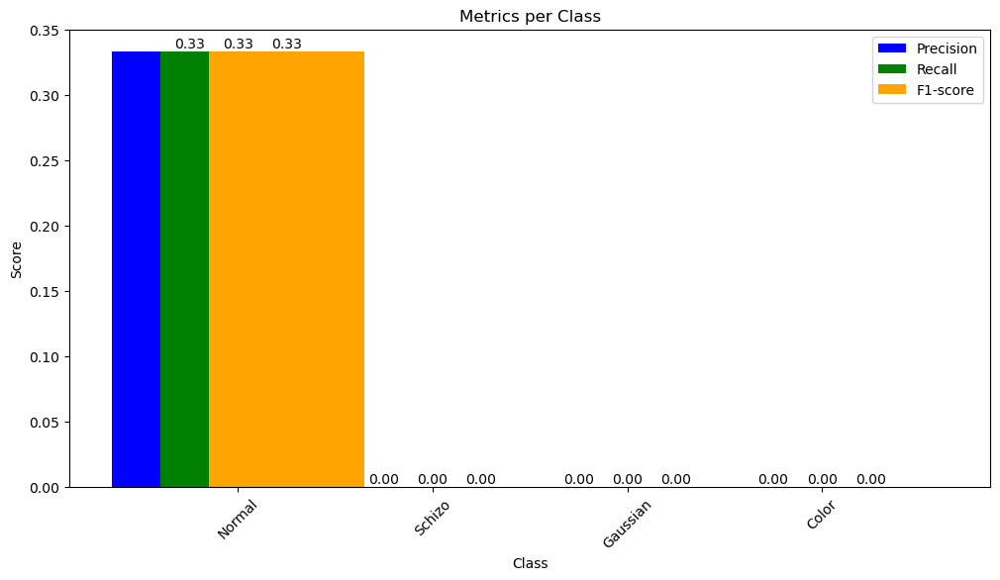

In [267]:
# this doesnt really make sense:

def recall(arr):
    all_y_pred = []
    all_y_true = []

    # Iterate over each letter in nn
    for letter in nn:
        # Retrieve the array dynamically based on the letter
        
        # Extract predictions and true labels from the array
        y_pred = [row[0] for row in arr]
        y_true = [row[1] for row in arr]

        # Accumulate predictions and true labels
        all_y_pred.extend(y_pred)
        all_y_true.extend(y_true)

    # Calculate precision
    precision = precision_score(all_y_true, all_y_pred, average='micro')

    # Calculate recall
    recall = recall_score(all_y_true, all_y_pred, average='micro')

    f1 = f1_score(all_y_true, all_y_pred, average='micro')


    return precision, recall, f1

np, nr, nf1 = recall(predict_arr_n)
bp, br, bf1 = recall(predict_arr_b)
gp, gr , gf1 = recall(predict_arr_g)
cp, cr, cf1  = recall(predict_arr_c)

class_labels = ['Normal', 'Schizo', 'Gaussian', 'Color'] 

# Plot metrics
plt.figure(figsize=(12, 6))

# Plot precision
bars_precision = plt.bar(range(len(class_labels)), [np, bp, gp, cp], color='blue', label='Precision')
# Plot recall
bars_recall = plt.bar([x + 0.25 for x in range(len(class_labels))], [nr, br, gr, cr], color='green', label='Recall')
# Plot F1-score
bars_f1 = plt.bar([x + 0.5 for x in range(len(class_labels))], [nf1, bf1, gf1, cf1], color='orange', label='F1-score')


plt.xlabel('Class')
plt.ylabel('Score')
plt.title('Metrics per Class')
plt.legend()

# Add text labels above the bars for precision, recall, and F1-score
for bars, metrics in zip([bars_precision, bars_recall, bars_f1], [[np, bp, gp, cp], [nr, br, gr, cr], [nf1, bf1, gf1, cf1]]):
    for bar, score in zip(bars, metrics):
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, yval, f'{score:.2f}', va='bottom', ha='center')

plt.xticks([r + 0.25 for r in range(len(class_labels))], class_labels)  # Set x-axis tick labels to class labels
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()